In [4]:
#from google.colab import drive
#drive.mount('/content/drive')

In [5]:
# Importing necessary libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 

In [6]:
# Phishing is a type of semantic attack,4 often used to steal user sensitive information including login credentials and 
# credit card numbers.5-7 It occurs when an attacker, masquerading as a trusted entity, entice a victim into clicking on a link
#  or opening an attachment in an email or instant message through social messaging services such as WhatsApp, Viber or Facebook Messenger.
# The data that we have below is representing the URL features.

In [7]:
phishingwebsite = pd.read_csv("C:/Users/HP/Desktop/phishingwebsite/Phishing.csv")
phishingwebsite.head(5)

,id,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,...,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
0,1,3,1,5,72,0,0,0,0,0,...,0,0,1,1,0,1,1,-1,1,1
1,2,3,1,3,144,0,0,0,0,2,...,0,0,0,1,-1,1,1,1,1,1
2,3,3,1,2,58,0,0,0,0,0,...,0,0,0,1,0,-1,1,-1,0,1
3,4,3,1,6,79,1,0,0,0,0,...,0,0,0,1,-1,1,1,1,-1,1
4,5,3,0,4,46,0,0,0,0,0,...,1,0,0,1,1,-1,0,-1,-1,1


In [8]:
phishingwebsite = phishingwebsite.drop(['id'], axis = 1)

In [9]:
# Welp, this is a very big dataset that has alot of information about webistes, which aslo includes their meta-data, last column 
# depicts what we are trying to predict, if the website is a phishing site or not.

In [10]:
phishingwebsite.shape

(10000, 49)

In [11]:
# But before moving forward, can somebody realize what problems will arise due to such a dimensional data?
# Would you fill a form or provide 50 such information just to see if the site is a phishing site or not?

In [12]:
phishingwebsite.isnull().sum()

NumDots                               0
SubdomainLevel                        0
PathLevel                             0
UrlLength                             0
NumDash                               0
NumDashInHostname                     0
AtSymbol                              0
TildeSymbol                           0
NumUnderscore                         0
NumPercent                            0
NumQueryComponents                    0
NumAmpersand                          0
NumHash                               0
NumNumericChars                       0
NoHttps                               0
RandomString                          0
IpAddress                             0
DomainInSubdomains                    0
DomainInPaths                         0
HttpsInHostname                       0
HostnameLength                        0
PathLength                            0
QueryLength                           0
DoubleSlashInPath                     0
NumSensitiveWords                     0


In [13]:
# This dataset contains 48 features extracted from 5000 phishing webpages and 5000 legitimate webpages.

phishingwebsite.describe()

,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,...,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,...,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,2.445100,0.586800,3.300300,70.264100,1.818000,0.138900,0.000300,0.013100,0.32320,0.073800,...,0.339600,0.03220,0.030400,0.956600,0.020200,0.353300,0.793200,0.173400,0.314100,0.500000
std,1.346836,0.751214,1.863241,33.369877,3.106258,0.545744,0.017319,0.113709,1.11466,0.622248,...,0.473597,0.17654,0.171694,0.248037,0.820036,0.888908,0.521019,0.755771,0.897843,0.500025
min,1.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.00000,0.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,2.000000,0.000000,2.000000,48.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.00000,0.000000,1.000000,-1.000000,-1.000000,1.000000,0.000000,-1.000000,0.000000
50%,2.000000,1.000000,3.000000,62.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.00000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.500000
75%,3.000000,1.000000,4.000000,84.000000,2.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,1.000000,0.00000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,21.000000,14.000000,18.000000,253.000000,55.000000,9.000000,1.000000,1.000000,18.00000,19.000000,...,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [14]:
# Classes to predict from.

phishingwebsite['CLASS_LABEL'].value_counts()

1    5000
0    5000
Name: CLASS_LABEL, dtype: int64

In [15]:
# Finding more from the data

phishingwebsite_class = phishingwebsite.groupby('CLASS_LABEL')
phishingwebsite_class['NoHttps'].value_counts()

CLASS_LABEL  NoHttps
0            1          4982
             0            18
1            1          4906
             0            94
Name: NoHttps, dtype: int64

In [16]:
phishingwebsite_class['UrlLength'].mean()

CLASS_LABEL
0    72.7498
1    67.7784
Name: UrlLength, dtype: float64

In [17]:
phishingwebsite_class['NumPercent'].mean()

CLASS_LABEL
0    0.1164
1    0.0312
Name: NumPercent, dtype: float64

In [18]:
phishingwebsite_class['NumAmpersand'].mean()

CLASS_LABEL
0    0.3682
1    0.1862
Name: NumAmpersand, dtype: float64

In [19]:
phishingwebsite_class['NumHash'].mean()

CLASS_LABEL
0    0.0000
1    0.0046
Name: NumHash, dtype: float64

In [20]:
phishingwebsite_class['IpAddress'].value_counts()

CLASS_LABEL  IpAddress
0            0            5000
1            0            4828
             1             172
Name: IpAddress, dtype: int64

In [21]:
phishingwebsite.columns

Index(['NumDots', 'SubdomainLevel', 'PathLevel', 'UrlLength', 'NumDash',
       'NumDashInHostname', 'AtSymbol', 'TildeSymbol', 'NumUnderscore',
       'NumPercent', 'NumQueryComponents', 'NumAmpersand', 'NumHash',
       'NumNumericChars', 'NoHttps', 'RandomString', 'IpAddress',
       'DomainInSubdomains', 'DomainInPaths', 'HttpsInHostname',
       'HostnameLength', 'PathLength', 'QueryLength', 'DoubleSlashInPath',
       'NumSensitiveWords', 'EmbeddedBrandName', 'PctExtHyperlinks',
       'PctExtResourceUrls', 'ExtFavicon', 'InsecureForms',
       'RelativeFormAction', 'ExtFormAction', 'AbnormalFormAction',
       'PctNullSelfRedirectHyperlinks', 'FrequentDomainNameMismatch',
       'FakeLinkInStatusBar', 'RightClickDisabled', 'PopUpWindow',
       'SubmitInfoToEmail', 'IframeOrFrame', 'MissingTitle',
       'ImagesOnlyInForm', 'SubdomainLevelRT', 'UrlLengthRT',
       'PctExtResourceUrlsRT', 'AbnormalExtFormActionR', 'ExtMetaScriptLinkRT',
       'PctExtNullSelfRedirectHyperlinksRT

In [22]:
###! pip install klib

### Feature Engineering Skills

In [23]:
import klib

#### Functions for visualizing datasets

In [24]:
phishingwebsite.describe()

,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,...,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,...,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,2.445100,0.586800,3.300300,70.264100,1.818000,0.138900,0.000300,0.013100,0.32320,0.073800,...,0.339600,0.03220,0.030400,0.956600,0.020200,0.353300,0.793200,0.173400,0.314100,0.500000
std,1.346836,0.751214,1.863241,33.369877,3.106258,0.545744,0.017319,0.113709,1.11466,0.622248,...,0.473597,0.17654,0.171694,0.248037,0.820036,0.888908,0.521019,0.755771,0.897843,0.500025
min,1.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.00000,0.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,2.000000,0.000000,2.000000,48.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.00000,0.000000,1.000000,-1.000000,-1.000000,1.000000,0.000000,-1.000000,0.000000
50%,2.000000,1.000000,3.000000,62.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.00000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.500000
75%,3.000000,1.000000,4.000000,84.000000,2.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,1.000000,0.00000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,21.000000,14.000000,18.000000,253.000000,55.000000,9.000000,1.000000,1.000000,18.00000,19.000000,...,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [25]:
klib.describe 

<module 'klib.describe' from 'c:\\ProgramData\\Anaconda3\\lib\\site-packages\\klib\\describe.py'>

In [26]:
klib.cat_plot(phishingwebsite)

No columns with categorical data were detected.


In [27]:
klib.corr_mat(phishingwebsite)

,NumDots,SubdomainLevel,PathLevel,UrlLength,NumDash,NumDashInHostname,AtSymbol,TildeSymbol,NumUnderscore,NumPercent,NumQueryComponents,NumAmpersand,NumHash,NumNumericChars,NoHttps,RandomString,IpAddress,DomainInSubdomains,DomainInPaths,HttpsInHostname,HostnameLength,PathLength,QueryLength,DoubleSlashInPath,NumSensitiveWords,EmbeddedBrandName,PctExtHyperlinks,PctExtResourceUrls,ExtFavicon,InsecureForms,RelativeFormAction,ExtFormAction,AbnormalFormAction,PctNullSelfRedirectHyperlinks,FrequentDomainNameMismatch,FakeLinkInStatusBar,RightClickDisabled,PopUpWindow,SubmitInfoToEmail,IframeOrFrame,MissingTitle,ImagesOnlyInForm,SubdomainLevelRT,UrlLengthRT,PctExtResourceUrlsRT,AbnormalExtFormActionR,ExtMetaScriptLinkRT,PctExtNullSelfRedirectHyperlinksRT,CLASS_LABEL
NumDots,1.00,0.51,0.08,0.28,-0.20,0.09,0.01,0.11,0.04,0.02,0.17,0.26,0.37,0.21,0.02,-0.06,0.16,0.24,0.01,-,0.29,0.00,0.26,0.00,0.31,0.16,0.12,-0.04,0.05,0.07,-0.09,-0.01,-0.03,0.03,0.18,-0.00,0.05,-0.03,-0.12,-0.12,0.05,-0.01,-0.34,-0.15,0.05,0.03,0.04,-0.15,0.29
SubdomainLevel,0.51,1.00,0.01,0.10,-0.05,0.25,-0.01,0.01,-0.02,-0.01,-0.03,-0.03,-0.02,0.05,-0.04,0.08,-0.10,0.52,-0.02,-,0.61,-0.04,-0.03,0.01,0.16,0.02,-0.06,-0.08,-0.03,-0.04,-0.02,0.00,0.03,0.11,-0.06,-0.02,0.13,-0.01,-0.03,-0.00,0.03,-0.01,-0.68,-0.09,0.06,-0.03,0.09,-0.03,0.04
PathLevel,0.08,0.01,1.00,0.39,0.09,0.03,-0.01,0.13,0.02,-0.04,-0.14,-0.10,0.01,0.23,0.06,0.25,0.02,0.01,0.26,-,0.01,0.61,-0.09,0.02,0.12,0.09,0.02,-0.04,0.08,0.10,0.01,-0.01,-0.03,0.09,0.03,-0.00,0.05,0.01,-0.06,0.00,-0.03,-0.00,-0.02,-0.40,-0.00,0.04,0.06,-0.10,0.23
UrlLength,0.28,0.10,0.39,1.00,0.44,0.11,-0.00,0.06,0.35,0.18,0.48,0.47,0.23,0.64,0.04,0.23,0.09,0.12,0.23,-,0.16,0.64,0.65,0.00,0.22,0.03,-0.10,-0.05,0.06,-0.00,0.05,0.02,0.02,-0.09,-0.10,0.01,0.09,0.03,0.04,0.03,-0.05,-0.04,-0.13,-0.80,0.00,-0.03,-0.00,0.14,-0.07
NumDash,-0.20,-0.05,0.09,0.44,1.00,0.11,-0.01,-0.02,-0.05,-0.02,-0.06,-0.06,-0.02,0.12,0.04,0.25,-0.06,0.06,0.32,-,0.01,0.61,-0.01,-0.00,-0.08,-0.04,-0.07,0.12,0.09,-0.09,0.09,0.08,0.05,-0.11,-0.19,-0.01,0.06,0.09,0.18,0.23,-0.06,-0.01,-0.02,-0.47,-0.14,-0.09,-0.12,0.18,-0.37
NumDashInHostname,0.09,0.25,0.03,0.11,0.11,1.00,-0.00,-0.02,-0.04,-0.02,-0.04,-0.04,-0.01,0.12,-0.09,0.07,-0.03,0.54,0.04,-,0.55,0.00,-0.03,0.07,0.08,0.01,-0.03,-0.08,0.00,0.01,0.08,-0.01,-0.04,0.18,-0.02,-0.01,0.44,-0.02,-0.06,0.04,-0.01,-0.01,-0.36,-0.10,0.08,0.04,0.07,-0.11,0.15
AtSymbol,0.01,-0.01,-0.01,-0.00,-0.01,-0.00,1.00,-0.00,-0.01,0.01,-0.01,-0.00,-0.00,0.00,0.00,0.02,-0.00,-0.00,0.01,-,-0.01,0.01,-0.01,-0.00,-0.01,0.02,-0.01,-0.01,0.01,0.01,-0.01,0.01,-0.00,-0.01,-0.01,-0.00,-0.00,-0.00,-0.01,-0.01,-0.00,-0.00,0.00,-0.01,-0.01,-0.00,0.01,0.01,-0.02
TildeSymbol,0.11,0.01,0.13,0.06,-0.02,-0.02,-0.00,1.00,-0.02,-0.01,-0.02,-0.03,-0.01,0.11,-0.06,0.01,0.23,-0.02,0.02,-,-0.02,0.08,0.00,-0.00,0.07,0.04,-0.01,-0.03,-0.03,0.00,-0.05,-0.02,-0.01,0.00,0.04,-0.01,0.00,-0.01,-0.04,-0.04,-0.01,-0.02,0.02,-0.04,0.02,0.02,0.06,-0.00,0.10
NumUnderscore,0.04,-0.02,0.02,0.35,-0.05,-0.04,-0.01,-0.02,1.00,0.06,0.34,0.28,-0.00,0.13,0.03,-0.00,0.10,-0.03,0.05,-,-0.05,0.11,0.38,-0.01,0.03,-0.02,-0.04,-0.02,-0.03,-0.02,0.06,0.02,0.05,-0.10,-0.04,0.02,-0.02,0.00,0.04,-0.01,-0.02,-0.02,0.00,-0.26,0.01,-0.05,-0.05,0.10,-0.10
NumPercent,0.02,-0.01,-0.04,0.18,-0.02,-0.02,0.01,-0.01,0.06,1.00,0.13,0.09,-0.00,0.12,0.01,-0.01,-0.02,-0.02,-0.03,-,-0.03,-0.04,0.31,-0.00,0.06,-0.00,-0.02,-0.02,-0.03,-0.02,0.02,-0.02,0.01,-0.02,-0.03,-0.01,-0.01,-0.00,0.00,-0.02,-0.01,-0.01,0.01,-0.13,0.02,-0.00,0.02,0.04,-0.07


<AxesSubplot:title={'center':'Feature-correlation (pearson)'}>

<Figure size 1080x576 with 0 Axes>

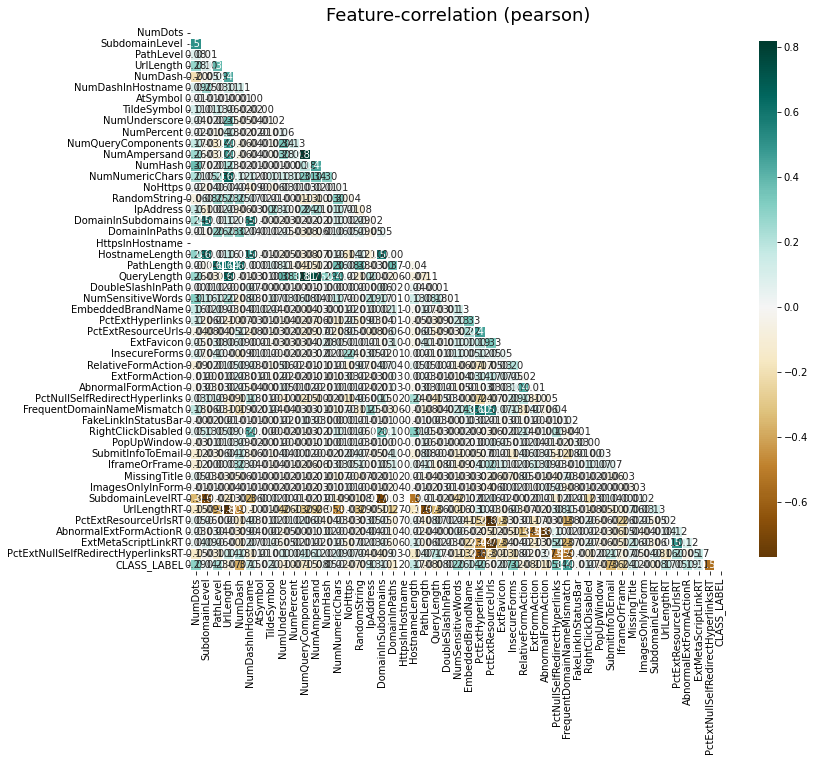

In [28]:
plt.figure(figsize=[15,8])
klib.corr_plot(phishingwebsite)

In [29]:
klib.missingval_plot(phishingwebsite)

No missing values found in the dataset.


### functions for cleaning datasets

performs datacleaning (drop duplicates & empty rows/cols, adjust dtypes,...)

Please Note, the mentioned below function is used for analysis and we are not storing it .

In [30]:
klib.data_cleaning(phishingwebsite) 

Long column names detected (>25 characters). Consider renaming the following columns ['pct_null_self_redirect_hyperlinks', 'frequent_domain_name_mismatch', 'abnormal_ext_form_action_r', 'pct_ext_null_self_redirect_hyperlinks_rt'].
Shape of cleaned data: (9581, 48) - Remaining NAs: 0


Dropped rows: 419
     of which 419 duplicates. (Rows (first 150 shown): [118, 128, 132, 133, 144, 162, 180, 248, 264, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 380, 449, 455, 456, 464, 499, 507, 526, 537, 539, 541, 548, 550, 570, 575, 581, 596, 634, 639, 655, 672, 678, 699, 727, 738, 739, 742, 754, 793, 799, 803, 811, 823, 838, 864, 873, 909, 916, 954, 992, 1001, 1002, 1003, 1008, 1013, 1082, 1084, 1086, 1095, 1096, 1097, 1098, 1134, 1168, 1176, 1187, 1191, 1223, 1253, 1267, 1268, 1271, 1311, 1328, 1332, 1334, 1348, 1379, 1382, 1388, 1392, 1424, 1425, 1435, 1490, 1496, 1505, 1507, 1508, 1510, 1521, 1532, 1536, 1543, 1547, 1548, 1549, 1550, 1552, 1553, 1555, 1556, 156

,num_dots,subdomain_level,path_level,url_length,num_dash,num_dash_in_hostname,at_symbol,tilde_symbol,num_underscore,num_percent,...,iframe_or_frame,missing_title,images_only_in_form,subdomain_level_rt,url_length_rt,pct_ext_resource_urls_rt,abnormal_ext_form_action_r,ext_meta_script_link_rt,pct_ext_null_self_redirect_hyperlinks_rt,class_label
0,3,1,5,72,0,0,0,0,0,0,...,0,0,1,1,0,1,1,-1,1,1
1,3,1,3,144,0,0,0,0,2,0,...,0,0,0,1,-1,1,1,1,1,1
2,3,1,2,58,0,0,0,0,0,0,...,0,0,0,1,0,-1,1,-1,0,1
3,3,1,6,79,1,0,0,0,0,0,...,0,0,0,1,-1,1,1,1,-1,1
4,3,0,4,46,0,0,0,0,0,0,...,1,0,0,1,1,-1,0,-1,-1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9576,3,1,1,50,0,0,0,0,0,0,...,0,0,0,1,1,-1,1,0,1,0
9577,2,1,4,59,1,0,0,0,0,0,...,1,0,0,1,0,0,1,0,1,0
9578,2,1,4,57,0,0,0,0,0,0,...,0,0,0,1,0,1,1,0,1,0
9579,3,1,1,49,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,1,0


In [31]:
phishingwebsite = klib.clean_column_names(phishingwebsite)

Long column names detected (>25 characters). Consider renaming the following columns ['pct_null_self_redirect_hyperlinks', 'frequent_domain_name_mismatch', 'abnormal_ext_form_action_r', 'pct_ext_null_self_redirect_hyperlinks_rt'].


In [32]:
phishingwebsite = klib.convert_datatypes(phishingwebsite)

In [33]:
phishingwebsite = klib.drop_missing(phishingwebsite)

In [34]:
klib.missingval_plot(phishingwebsite) 

No missing values found in the dataset.


Displaying positive correlations. Specify a positive "threshold" to limit the results further.
Displaying negative correlations. Specify a negative "threshold" to limit the results further.


<AxesSubplot:title={'center':'Feature-correlation (pearson)'}>

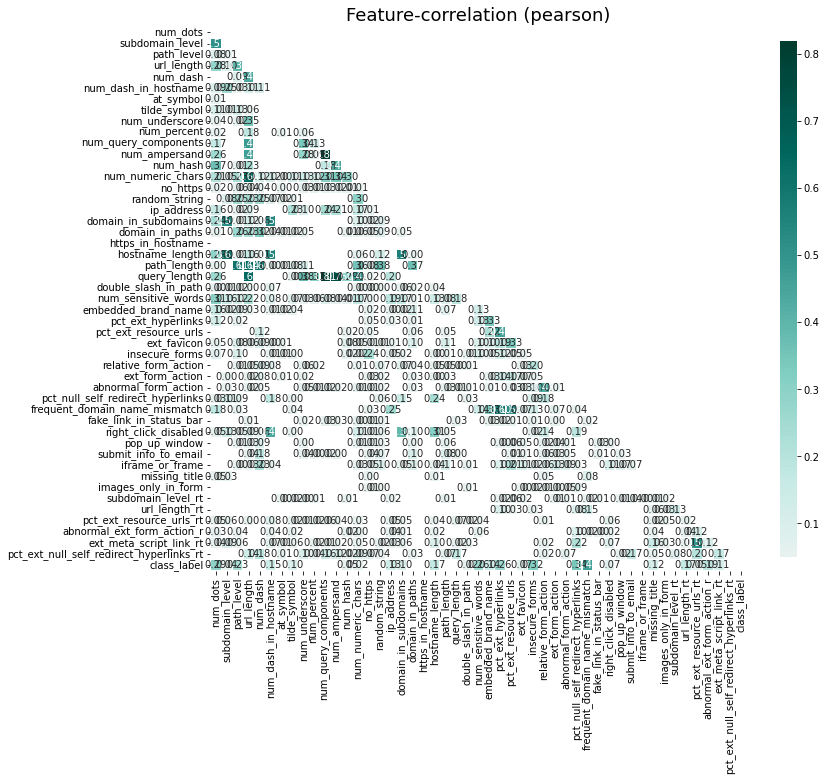

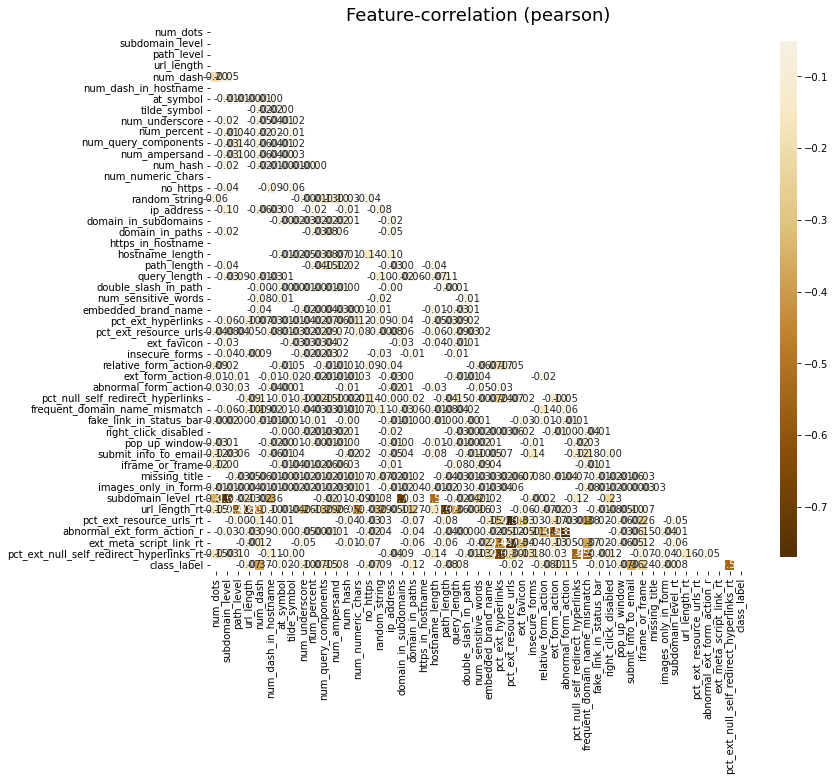

In [35]:
klib.corr_plot(phishingwebsite, split='pos') # displaying only positive correlations, other settings include threshold, cmap...
klib.corr_plot(phishingwebsite, split='neg') # displaying only negative correlations

In [36]:
phishingwebsite.columns

Index(['num_dots', 'subdomain_level', 'path_level', 'url_length', 'num_dash',
       'num_dash_in_hostname', 'at_symbol', 'tilde_symbol', 'num_underscore',
       'num_percent', 'num_query_components', 'num_ampersand', 'num_hash',
       'num_numeric_chars', 'no_https', 'random_string', 'ip_address',
       'domain_in_subdomains', 'domain_in_paths', 'https_in_hostname',
       'hostname_length', 'path_length', 'query_length',
       'double_slash_in_path', 'num_sensitive_words', 'embedded_brand_name',
       'pct_ext_hyperlinks', 'pct_ext_resource_urls', 'ext_favicon',
       'insecure_forms', 'relative_form_action', 'ext_form_action',
       'abnormal_form_action', 'pct_null_self_redirect_hyperlinks',
       'frequent_domain_name_mismatch', 'fake_link_in_status_bar',
       'right_click_disabled', 'pop_up_window', 'submit_info_to_email',
       'iframe_or_frame', 'missing_title', 'images_only_in_form',
       'subdomain_level_rt', 'url_length_rt', 'pct_ext_resource_urls_rt',
       'a

<AxesSubplot:title={'center':'Feature-correlation (pearson)'}>

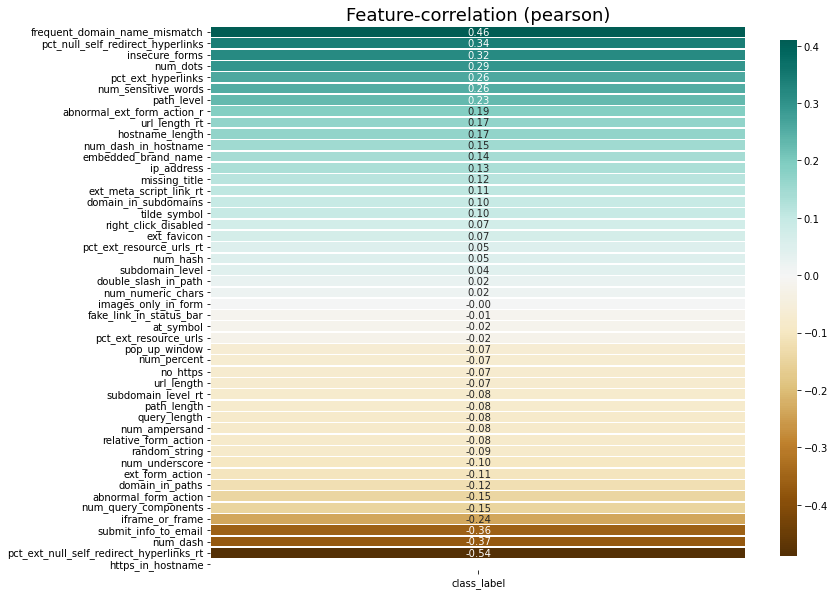

In [37]:
klib.corr_plot(phishingwebsite, target='class_label') # default representation of correlations with the feature column

In [38]:

klib.cat_plot(phishingwebsite, top=4, bottom=4) 

No columns with categorical data were detected.


In [39]:
phishingwebsite.columns

Index(['num_dots', 'subdomain_level', 'path_level', 'url_length', 'num_dash',
       'num_dash_in_hostname', 'at_symbol', 'tilde_symbol', 'num_underscore',
       'num_percent', 'num_query_components', 'num_ampersand', 'num_hash',
       'num_numeric_chars', 'no_https', 'random_string', 'ip_address',
       'domain_in_subdomains', 'domain_in_paths', 'https_in_hostname',
       'hostname_length', 'path_length', 'query_length',
       'double_slash_in_path', 'num_sensitive_words', 'embedded_brand_name',
       'pct_ext_hyperlinks', 'pct_ext_resource_urls', 'ext_favicon',
       'insecure_forms', 'relative_form_action', 'ext_form_action',
       'abnormal_form_action', 'pct_null_self_redirect_hyperlinks',
       'frequent_domain_name_mismatch', 'fake_link_in_status_bar',
       'right_click_disabled', 'pop_up_window', 'submit_info_to_email',
       'iframe_or_frame', 'missing_title', 'images_only_in_form',
       'subdomain_level_rt', 'url_length_rt', 'pct_ext_resource_urls_rt',
       'a

#### HV PLOT

In [108]:
import hvplot.pandas  # noqa
from bokeh.sampledata.penguins import data as df

phishingwebsite.hvplot.scatter(x='submit_info_to_email', y='url_length', by='class_label')

:NdOverlay   [class_label]
   :Scatter   [submit_info_to_email]   (url_length)

In [112]:
import hvplot.pandas  # noqa

plot1 = phishingwebsite.hvplot(x='path_length', y='relative_form_action', width=400)
plot2 = phishingwebsite.hvplot(x='path_length', y='domain_in_paths', width=400)
plot1 + plot2

:Layout
   .Curve.I  :Curve   [path_length]   (relative_form_action)
   .Curve.II :Curve   [path_length]   (domain_in_paths)

In [113]:
import hvplot.pandas
### from bokeh.sampledata.penguins import data as df

hvexplorer = hvplot.explorer(phishingwebsite)
hvexplorer

hvDataFrameExplorer(axes=Axes(explorer=..., height=None, legend='right', logx=False, logy=False, name='Axes02621', responsive=False, shared_axes=True, width=None, xlim=None, ylim=None), by=[], colormapping=Colormapping(clim=None, cmap='kbc_r', cnorm='linear', color=None, colorbar=None, explorer=..., name='Colormapping02651', rescale_discrete_levels=True, symmetric=False), groupby=[], kind='line', labels=Labels(clabel='', explorer=..., fontscale=1, name='Labels02672', rot=0, title='', xlabel='', ylabel=''), name='hvDataFrameExplorer02606', operations=Operations(aggregator=None, datashade=False, dynspread=False, explorer=..., name='Operations02692', rasterize=False, x_sampling=None, y_sampling=None), style=Style(alpha=1, explorer=..., name='Style02712'), x='index', y='num_dots', y_multi=[], z=None)

##### Features and Label

In [40]:
y = phishingwebsite['class_label']
X = phishingwebsite.drop(['class_label'], axis = 1)

In [41]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier

#### Random Forest Classifier

In [42]:
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.2, random_state = 42)

In [43]:
random_model = RandomForestClassifier(n_estimators=250, n_jobs = -1)

In [44]:
#Fit
random_model.fit(Xtrain, ytrain)

y_pred = random_model.predict(Xtest)

#Checking the accuracy
random_model_accuracy = round(random_model.score(Xtrain, ytrain)*100,2)
print(round(random_model_accuracy, 2), '%')

100.0 %


#### Gradient Boosting Classifier

In [45]:
from sklearn.ensemble import GradientBoostingClassifier

In [46]:
gradient_model = GradientBoostingClassifier()

In [47]:
#Fit
gradient_model.fit(Xtrain, ytrain)

y_pred = gradient_model.predict(Xtest)

#Checking the accuracy
gradient_model_accuracy = round(gradient_model.score(Xtrain, ytrain)*100,2)
print(round(gradient_model_accuracy, 2), '%')

98.35 %


In [48]:
gradient_model_accuracy = round(gradient_model.score(Xtest, ytest)*100,2)
print(round(gradient_model_accuracy, 2), '%')

98.05 %


#### Hyper Parameter Tuning

In [49]:
import optuna
import sklearn

In [50]:
param_grid = {
"learning_rate": [0.1, 0.2, 0.3, 0.4, 0.5],
"max_depth": [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
"subsample": [0.0, 1.0],
"min_samples_leaf": [1, 2, 4, 6, 8, 10],
"min_samples_split": [2, 5, 10, 15, 20],
"n_estimators": [200, 400, 600, 800, 1000, 1200, 1300]
}

In [51]:
from sklearn.model_selection import cross_val_score

In [52]:

def objective(trial):

    learning_rate = trial.suggest_float("learning_rate", 0.1, 0.5)
    max_depth = trial.suggest_int('max_depth', 10, 300)
    subsample = trial.suggest_float("subsample", 0.0, 1.0)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 12)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    n_estimators = trial.suggest_int('n_estimators', 200, 1800)
 
    classf = GradientBoostingClassifier( learning_rate = learning_rate,max_depth = max_depth, subsample = subsample, min_samples_leaf = min_samples_leaf,min_samples_split = min_samples_split,n_estimators = n_estimators)
 
 
#regr.fit(X_train, y_train)
#y_pred = regr.predict(X_val)
#return r2_score(y_val, y_pred)
 
    score = cross_val_score(classf, Xtrain, ytrain, cv=5, scoring="accuracy")
    meanvalues = score.mean()
    return meanvalues

In [53]:
#Execute optuna and set hyperparameters
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)

[I 2022-10-13 16:46:56,230] A new study created in memory with name: no-name-95530dbe-3553-4446-a09b-9a551315e262
[I 2022-10-13 16:52:09,719] Trial 0 finished with value: 0.9636250000000001 and parameters: {'learning_rate': 0.4346311554283727, 'max_depth': 90, 'subsample': 0.6384697453982741, 'min_samples_leaf': 10, 'min_samples_split': 19, 'n_estimators': 984}. Best is trial 0 with value: 0.9636250000000001.
[I 2022-10-13 17:06:49,280] Trial 1 finished with value: 0.9365 and parameters: {'learning_rate': 0.3763720782914728, 'max_depth': 190, 'subsample': 0.7791373849844713, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 1700}. Best is trial 0 with value: 0.9636250000000001.
[I 2022-10-13 17:19:27,248] Trial 2 finished with value: 0.9780000000000001 and parameters: {'learning_rate': 0.1475904537479024, 'max_depth': 200, 'subsample': 0.9824990740138339, 'min_samples_leaf': 6, 'min_samples_split': 20, 'n_estimators': 1183}. Best is trial 2 with value: 0.9780000000000001.

In [54]:
print("Number of completed trials: {}".format(len(study.trials)))

Number of completed trials: 10


In [59]:
trail = study.best_trial

In [60]:
optuna.visualization.plot_optimization_history(study)

In [62]:
optimised_gb = GradientBoostingClassifier( learning_rate = study.best_params['learning_rate'], 
max_depth = study.best_params['max_depth'],
subsample = study.best_params['subsample'],
min_samples_leaf = study.best_params['min_samples_leaf'],
min_samples_split = study.best_params['min_samples_split'],
n_estimators = study.best_params['n_estimators'])

In [63]:
optimised_gb.fit(Xtrain, ytrain)

GradientBoostingClassifier(learning_rate=0.32899019216520975, max_depth=206,
                           min_samples_leaf=4, min_samples_split=8,
                           n_estimators=373, subsample=0.9499264197654916)

In [64]:
optimised_gb.score(Xtrain,ytrain)

1.0

### AdaBoost Classifier 

In [65]:
from sklearn.ensemble import AdaBoostClassifier

In [68]:
ada_model = AdaBoostClassifier()

#Fit
ada_model.fit(Xtrain, ytrain)

y_pred = ada_model.predict(Xtest)

#Checking the accuracy
ada_model_accuracy = round(ada_model.score(Xtrain, ytrain)*100,2)
print(round(ada_model_accuracy, 2), '%')




97.6 %


In [69]:
ada_model_accuracy = round(ada_model.score(Xtest, ytest)*100,2)
print(round(ada_model_accuracy , 2), '%')

97.4 %


In [90]:
import optuna
import sklearn

param_grid = {
"learning_rate": [0.1, 0.2, 0.3, 0.4, 0.5],
"n_estimators": [200, 400, 600, 800, 1000, 1200, 1300]
}


In [91]:
from sklearn.model_selection import cross_val_score


def objective(trial):

    learning_rate = trial.suggest_float("learning_rate", 0.1, 0.5)
    n_estimators = trial.suggest_int('n_estimators', 200, 1800)
 
    classf = AdaBoostClassifier( learning_rate = learning_rate, n_estimators = n_estimators)
    score = cross_val_score(classf, Xtrain, ytrain, cv=5, scoring="accuracy")
    meanvalues = score.mean()
    return meanvalues
 

In [92]:
#Execute optuna and set hyperparameters
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)


[I 2022-10-13 18:23:32,022] A new study created in memory with name: no-name-e0364929-c69e-4a87-8319-955959c5c323
[I 2022-10-13 18:23:58,124] Trial 0 finished with value: 0.9733750000000001 and parameters: {'learning_rate': 0.15566295245233036, 'n_estimators': 505}. Best is trial 0 with value: 0.9733750000000001.
[I 2022-10-13 18:25:07,773] Trial 1 finished with value: 0.977125 and parameters: {'learning_rate': 0.40865019648056433, 'n_estimators': 1282}. Best is trial 1 with value: 0.977125.
[I 2022-10-13 18:26:41,959] Trial 2 finished with value: 0.976875 and parameters: {'learning_rate': 0.2878973731905068, 'n_estimators': 1598}. Best is trial 1 with value: 0.977125.
[I 2022-10-13 18:27:57,884] Trial 3 finished with value: 0.977 and parameters: {'learning_rate': 0.48329782354547657, 'n_estimators': 1654}. Best is trial 1 with value: 0.977125.
[I 2022-10-13 18:28:31,119] Trial 4 finished with value: 0.976125 and parameters: {'learning_rate': 0.34153963212138727, 'n_estimators': 725}. 

In [93]:
optimised_ada = AdaBoostClassifier( learning_rate = study.best_params['learning_rate'], 
n_estimators = study.best_params['n_estimators'])

In [94]:
optimised_ada.fit(Xtrain, ytrain)

AdaBoostClassifier(learning_rate=0.40865019648056433, n_estimators=1282)

In [95]:
y_pred_ada = optimised_ada.predict(Xtest)

In [96]:
y_pred_optuna = optimised_gb.predict(Xtest)

#### Classification Metrics For AdaBoost Algorithm

In [97]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import mean_absolute_error
print(classification_report(ytest,y_pred_ada))
print(confusion_matrix(ytest,y_pred_ada))

              precision    recall  f1-score   support

           0       0.98      0.97      0.97       988
           1       0.97      0.98      0.97      1012

    accuracy                           0.97      2000
   macro avg       0.97      0.97      0.97      2000
weighted avg       0.97      0.97      0.97      2000

[[961  27]
 [ 24 988]]


#### Classification Metrics For Adaboost Algorithm

In [98]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import mean_absolute_error
print(classification_report(ytest,y_pred_optuna))
print(confusion_matrix(ytest,y_pred_optuna))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98       988
           1       1.00      0.97      0.98      1012

    accuracy                           0.98      2000
   macro avg       0.98      0.98      0.98      2000
weighted avg       0.98      0.98      0.98      2000

[[984   4]
 [ 35 977]]


In [99]:
# Save the trained model as a pickle string.
import pickle 

saved_model = pickle.dump(gradient_model, open('C:/Users/HP/Desktop/phishingwebsite/PhishingClassification.pickle','wb'))

In [103]:
plt.figure(figsize=[5,2])
from optuna.visualization import plot_param_importances
plot_param_importances(study)

<Figure size 360x144 with 0 Axes>